In [17]:
!pip uninstall yellowbrick

^C


In [111]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import koreanize_matplotlib
import random
import folium
import json
import googlemaps

from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.tree import plot_tree
from haversine import haversine
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
from folium import Marker
from folium.features import Choropleth
from sklearn.metrics import silhouette_samples, silhouette_score
from yellowbrick.cluster import silhouette_visualizer

%matplotlib inline

In [3]:
convenience = pd.read_csv('./data/convenience store.csv', index_col=0)
restroom = pd.read_csv('./data/restroom_data.csv', index_col=0)
sports = pd.read_csv('./data/ARR_SPORTS.csv', index_col=0)
tour = pd.read_csv('./data/ARR_TOURISM.csv', index_col=0)
food = pd.read_csv('./data/ARR_FOOD.csv', index_col=0)
culture = pd.read_csv('./data/ARR_CULTURE.CSV', index_col=0)
hospital = pd.read_csv('./data/ARR_HOSPITAL.csv', index_col=0)
poplutation = pd.read_csv('./data/poplutation.csv', index_col=0)
random_population_density_500 = pd.read_csv('./data/random_population_density_500.csv', index_col=0)
subway = pd.read_csv('./data/강남구지하철.csv', index_col=0)

# 전처리 된 데이터 확인

In [4]:
poplutation

,행정동명,월생활인구수,일생활인구수,dong,convenience_count,restroom_count,sports_count,tour_count,food_count,culture_count,subway_count
0,개포동,407.63892,13.58797,개포동,39,26,69,5.0,270,1.0,0.0
1,논현동,644.65914,21.48864,논현동,121,20,172,44.0,2045,12.0,3.0
2,대치동,862.82873,28.76095,대치동,99,23,161,15.0,1152,4.0,2.0
3,도곡동,474.15568,15.80519,도곡동,38,16,71,1.0,368,2.0,2.0
4,삼성동,583.99537,19.46651,삼성동,88,27,106,39.0,972,6.0,6.0
5,세곡동,326.24060,10.87469,세곡동,25,8,10,0.0,97,0.0,0.0
6,수서동,164.57392,5.48580,수서동,15,9,23,0.0,123,0.0,1.0
7,신사동,264.60904,8.82030,신사동,66,13,117,30.0,1548,10.0,2.0
8,압구정동,311.07504,10.36917,압구정동,8,10,11,0.0,94,0.0,0.0
9,역삼동,1170.12100,39.00403,역삼동,203,29,252,97.0,2694,7.0,2.0


In [24]:
bar_1 = poplutation.melt('dong', 'food_count')
bar_2 = poplutation.melt('dong', ['convenience_count', 'restroom_count', 'sports_count'])
bar_3 = poplutation.melt('dong', ['culture_count', 'tour_count'])

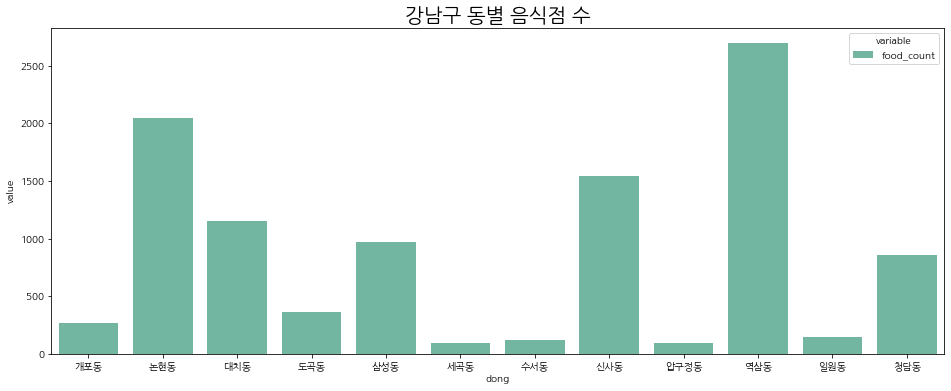

In [25]:
plt.figure(figsize=(16, 6))
sns.barplot(data=bar_1, x='dong', y='value', hue='variable', palette='Set2', lw=2)
plt.title('강남구 동별 음식점 수', fontsize=20)
plt.show()

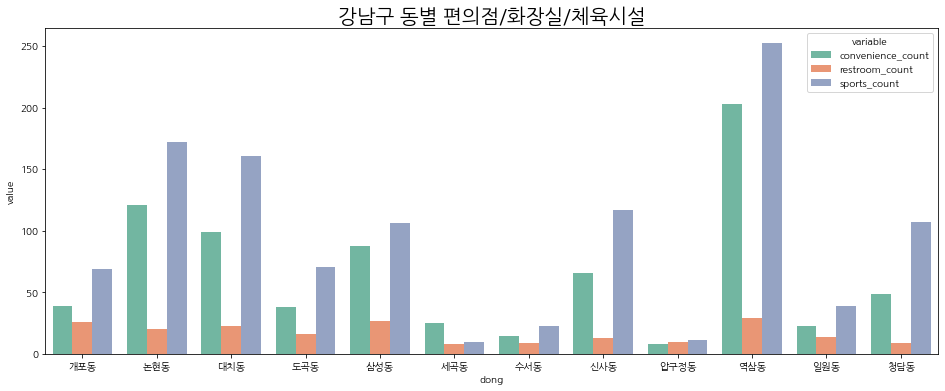

In [28]:
plt.figure(figsize=(16, 6))
sns.barplot(data=bar_2, x='dong', y='value', hue='variable', palette='Set2', lw=2)
plt.title('강남구 동별 편의점/화장실/체육시설', fontsize=20)
plt.show()

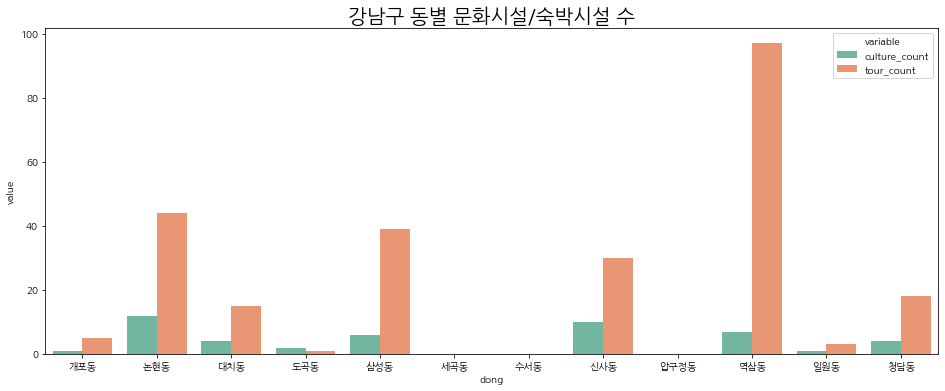

In [29]:
plt.figure(figsize=(16, 6))
sns.barplot(data=bar_3, x='dong', y='value', hue='variable', palette='Set2', lw=2)
plt.title('강남구 동별 문화시설/숙박시설 수', fontsize=20)
plt.show()

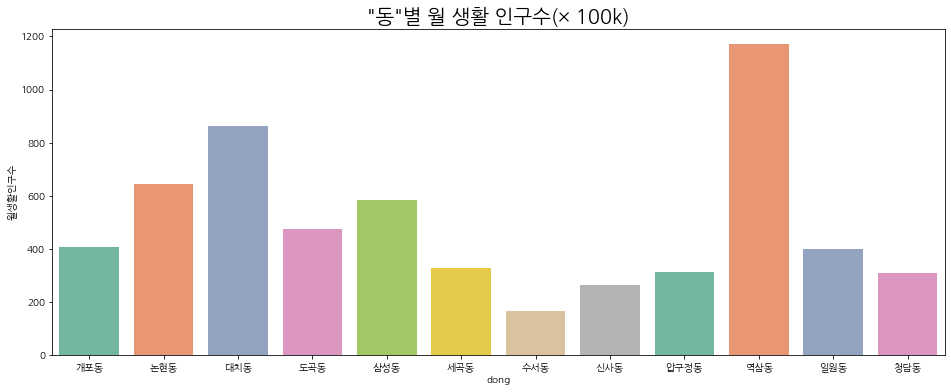

In [30]:
plt.figure(figsize=(16, 6))
sns.barplot(data=poplutation, x='dong', y='월생활인구수', palette='Set2', lw=2)
plt.title('"동"별 월 생활 인구수(× 100k)', fontsize=20)
plt.show()

In [20]:
pop_of_density = random_population_density_500.iloc[:, -10:]
pop_of_density

,s_dong,population,population_day,pop_of_convenience,pop_of_restroom,pop_of_sports,pop_of_tour,pop_of_food,pop_of_culture,pop_of_hospital
0,논현동,644.65914,21.48864,1.442623,0.604971,1.349550,0.744579,20.475935,0.232681,12.843996
1,청담동,308.09127,10.26971,1.752727,0.681616,4.089697,0.292121,64.948280,0.292121,19.669494
2,세곡동,326.24060,10.87469,0.091957,0.183913,0.551740,0.000000,2.023046,0.000000,0.827610
3,일원동,400.22973,13.34099,0.974440,0.524699,1.798967,0.000000,7.270825,0.000000,5.097073
4,도곡동,474.15568,15.80519,1.391948,0.949055,2.910436,0.189811,15.437967,0.000000,5.820873
...,...,...,...,...,...,...,...,...,...,...
842,수서동,164.57392,5.48580,1.822888,1.093733,3.098910,0.000000,21.874658,0.000000,9.661307
843,수서동,164.57392,5.48580,2.005177,1.093733,3.281199,0.000000,23.515258,0.000000,9.843596
844,역삼동,1170.12100,39.00403,1.384472,0.179469,1.589579,0.692236,14.280576,0.051277,2.794583
845,신사동,264.60904,8.82030,3.401245,0.340124,7.142614,1.700622,58.388037,0.680249,57.934537


In [43]:
pop_of_bar_1 = pop_of_density.melt('s_dong', 'pop_of_food').sort_values('s_dong')
pop_of_bar_2 = pop_of_density.melt('s_dong', ['pop_of_convenience', 'pop_of_restroom', 'pop_of_sports']).sort_values('s_dong')
pop_of_bar_3 = pop_of_density.melt('s_dong', ['pop_of_culture', 'pop_of_tour']).sort_values('s_dong')

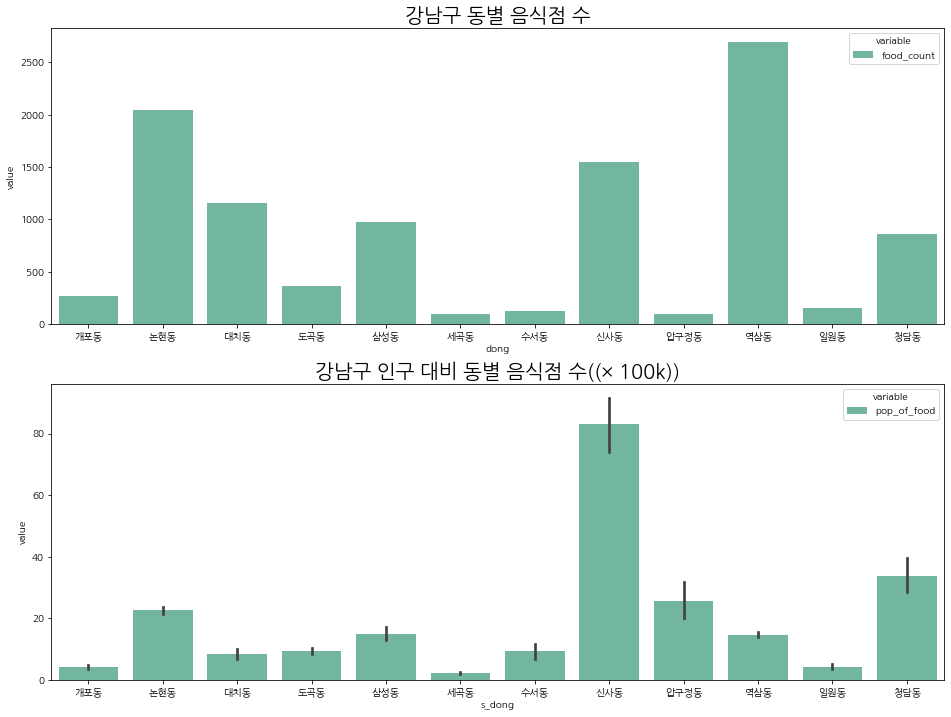

In [44]:
plt.figure(figsize=(16,12))
plt.subplot(211)
sns.barplot(data=bar_1, x='dong', y='value', hue='variable', palette='Set2', lw=2)
plt.title('강남구 동별 음식점 수', fontsize=20)

plt.subplot(212)
sns.barplot(data=pop_of_bar_1, x='s_dong', y='value', hue='variable', palette='Set2', lw=2)
plt.title('강남구 인구 대비 동별 음식점 수((× 100k))', fontsize=20)

plt.show()

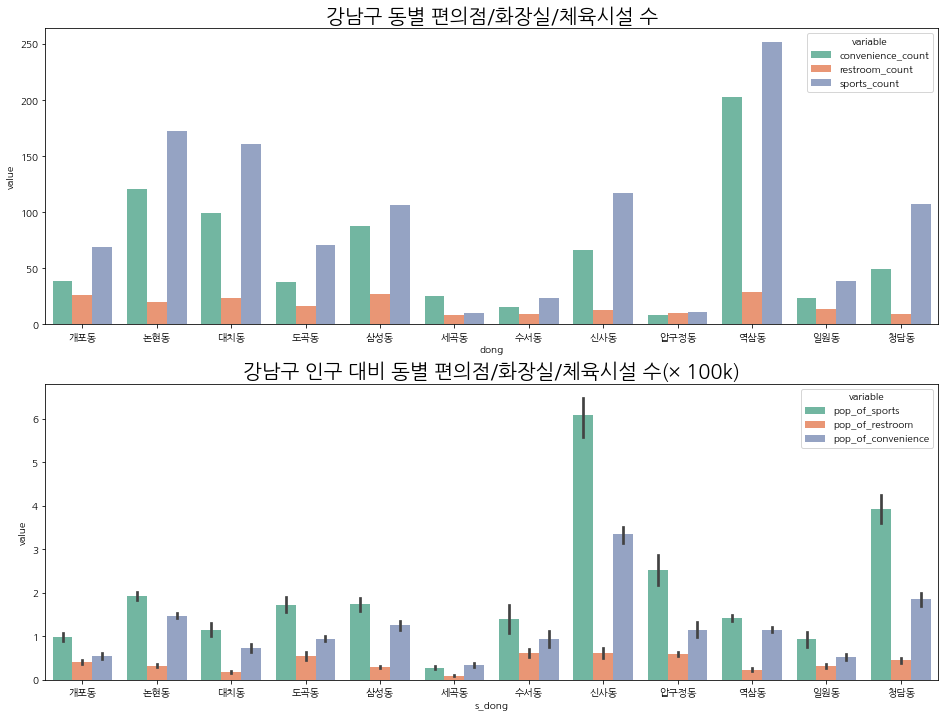

In [46]:
plt.figure(figsize=(16,12))
plt.subplot(211)
sns.barplot(data=bar_2, x='dong', y='value', hue='variable', palette='Set2', lw=2)
plt.title('강남구 동별 편의점/화장실/체육시설 수', fontsize=20)

plt.subplot(212)
sns.barplot(data=pop_of_bar_2, x='s_dong', y='value', hue='variable', palette='Set2', lw=2)
plt.title('강남구 인구 대비 동별 편의점/화장실/체육시설 수(× 100k)', fontsize=20)

plt.show()

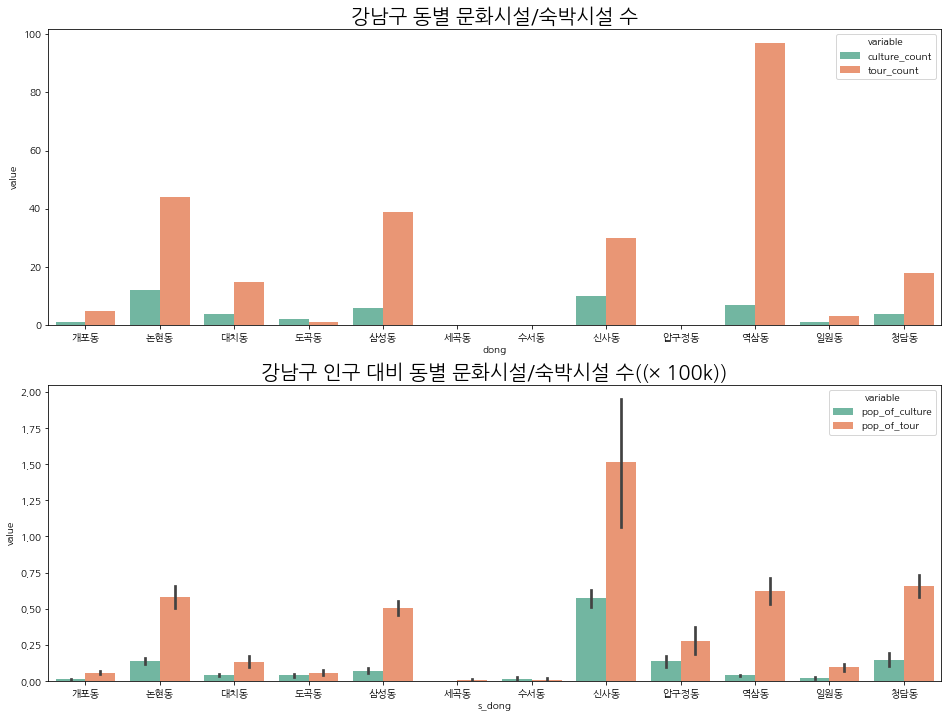

In [47]:
plt.figure(figsize=(16,12))
plt.subplot(211)
sns.barplot(data=bar_3, x='dong', y='value', hue='variable', palette='Set2', lw=2)
plt.title('강남구 동별 문화시설/숙박시설 수', fontsize=20)

plt.subplot(212)
sns.barplot(data=pop_of_bar_3, x='s_dong', y='value', hue='variable', palette='Set2', lw=2)
plt.title('강남구 인구 대비 동별 문화시설/숙박시설 수((× 100k))', fontsize=20)

plt.show()

# 모델링

## 랜덤 좌표 생성

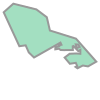

In [48]:
polylist = [
    (127.0158715456462, 37.52395552514407), \
    (127.03404427570877, 37.48455972739361), \
    (127.04138283634332, 37.48556651426365), \
    (127.04501866584928, 37.47730743834274), \
    (127.05109704553787, 37.47143038122402), \
    (127.08181938718701, 37.488766534231814), \
    (127.0829699570822, 37.486260930171355), \
    (127.07976935335684, 37.48555133810168), \
    (127.08025449404848, 37.48456891064258), \
    (127.07596786895694, 37.48317518162543), \
    (127.07585253680503, 37.48093174415405), \
    (127.08014959673851, 37.481631694208154), \
    (127.08196827786045, 37.48015279205741), \
    (127.08589130090392, 37.480023864131155), \
    (127.09622503041525, 37.48009699103141), \
    (127.09607233059212, 37.484457996448725), \
    (127.0968868132337, 37.484772684201445), \
    (127.09785785720334, 37.48375374466706), \
    (127.10049344132076, 37.48462551028881), \
    (127.09964813686373, 37.48665349416874), \
    (127.10261025731748, 37.486434716842325), \
    (127.10411019888349, 37.48364027975824), \
    (127.09961923020603, 37.48191421556131), \
    (127.10257722231188, 37.4788122144288), \
    (127.10497607049953, 37.48026073177465), \
    (127.10492453516474, 37.475746721996316), \
    (127.10001850811862, 37.47610237034757), \
    (127.09248874886488, 37.47578414076369), \
    (127.08669531549697, 37.47135556484104), \
    (127.09276829953566, 37.46414286714414), \
    (127.09964233625507, 37.46525452474618), \
    (127.1012649179668, 37.461432857267), \
    (127.09940991577305, 37.460461339593685), \
    (127.10162320409935, 37.45890971654731), \
    (127.10782171773475, 37.46211182557879), \
    (127.11387871956023, 37.461097011051415), \
    (127.1234727951866, 37.46660156429503), \
    (127.09986054922331, 37.49332977890127), \
    (127.06956401375487, 37.50279404849988), \
    (127.06595858545498, 37.51822131133216), \
    (127.05383896278687, 37.52730956318118), \
    (127.02705198082393, 37.53395010704315)]
polygon = Polygon(polylist)
polygon

In [49]:
lat = []
lng = []
for pol in polylist:
    lat.append(pol[1])
    lng.append(pol[0])

In [50]:
def generate_random_numbers(min_value, max_value, num_samples):
    random_numbers = []
    for _ in range(num_samples):
        random_numbers.append(random.uniform(min_value, max_value))
    return random_numbers

lat_range = generate_random_numbers(37.45901355607214, 37.53719881898076, 2500)
lng_range = generate_random_numbers(127.0088013935976, 127.12288623841854, 2500)
test = pd.DataFrame({'lat': lat_range, 'lng':lng_range})

In [51]:
test['inside'] = test.apply(lambda x: polygon.contains(Point(x['lng'], x['lat'])), axis=1)
test = test[test['inside']==True]

test

,lat,lng,inside
0,37.510967,127.030326,True
1,37.493527,127.052084,True
4,37.484196,127.047692,True
7,37.513182,127.052403,True
8,37.483344,127.082569,True
...,...,...,...
2480,37.502955,127.067193,True
2481,37.511182,127.042609,True
2485,37.515866,127.023242,True
2493,37.493143,127.064328,True


In [57]:
geo_path = './data/서울_자치구_경계_2017.geojson'
geo_str = json.load(open(geo_path, encoding='utf-8'))

In [65]:
m = folium.Map(location=[37.4966, 127.0628], zoom_start=13)
m.choropleth(geo_data=geo_str, fill_color='#bdbbbb')

for idx, row in test.iterrows():
    folium.Circle(
        location=[row['lat'], row['lng']],
        radius=50
    ).add_to(m)
    
m

c:\Users\baebi\miniconda3\envs\ds_study_2\lib\site-packages\folium\folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


In [ ]:
# 시설별 데이터 리스트에 담기 -> 데이터 안의 위도 경도 사용을 위해
lists = [food, convenience, hospital, sports, tour, restroom, culture ]

# 랜덤 좌표를 입력하면 반경500m 주변 시설들의 갯수 구하기
within = []
for index, row in test.iterrows(): # 랜덤 좌표
    within_500m = []
    c_lat = row['lat']
    c_lng = row['lng']
    c = (c_lat, c_lng)
    within_500m.append(c_lat)
    within_500m.append(c_lng)
    for lis in lists:
        count = 0 
        for idx, r in lis.iterrows():
            lat = r['lat']
            lng = r['lng']
            sub = (lat, lng)
    
            if haversine(c, sub, unit='m') < 500:
                count += 1
        within_500m.append(count)
    within.append(within_500m)

- 랜덤 좌표별로 '동'을 구하기 위한 노가다 작업을 해야 한다. -> '동'이 전처리 된 데이터 사용 : random_population_density_500.csv

In [68]:
random_population_density_500.iloc[:, 1:]

,lat,lng,food_500,convenience_500,hospital_500,sports_500,tour_500,restroom_500,culture_500,dong,s_dong,population,population_day,pop_of_convenience,pop_of_restroom,pop_of_sports,pop_of_tour,pop_of_food,pop_of_culture,pop_of_hospital
0,37.514758,127.023193,440,31,276,29,16,13,5,논현,논현동,644.65914,21.48864,1.442623,0.604971,1.349550,0.744579,20.475935,0.232681,12.843996
1,37.526978,127.042847,667,18,202,42,3,7,3,청담,청담동,308.09127,10.26971,1.752727,0.681616,4.089697,0.292121,64.948280,0.292121,19.669494
2,37.462859,127.108274,22,1,9,6,0,2,0,세곡,세곡동,326.24060,10.87469,0.091957,0.183913,0.551740,0.000000,2.023046,0.000000,0.827610
3,37.492787,127.078801,97,13,68,24,0,7,0,일원,일원동,400.22973,13.34099,0.974440,0.524699,1.798967,0.000000,7.270825,0.000000,5.097073
4,37.488674,127.036914,244,22,92,46,3,15,0,강남,도곡동,474.15568,15.80519,1.391948,0.949055,2.910436,0.189811,15.437967,0.000000,5.820873
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
842,37.489028,127.103476,120,10,53,17,0,6,0,강남,수서동,164.57392,5.48580,1.822888,1.093733,3.098910,0.000000,21.874658,0.000000,9.661307
843,37.489247,127.101722,129,11,54,18,0,6,0,강남,수서동,164.57392,5.48580,2.005177,1.093733,3.281199,0.000000,23.515258,0.000000,9.843596
844,37.497571,127.038916,557,54,109,62,27,7,2,역삼,역삼동,1170.12100,39.00403,1.384472,0.179469,1.589579,0.692236,14.280576,0.051277,2.794583
845,37.524446,127.028869,515,30,511,63,15,3,6,신사,신사동,264.60904,8.82030,3.401245,0.340124,7.142614,1.700622,58.388037,0.680249,57.934537


## KMeans

- 최적의 군집수 결정 : 
    - inertia : 군집 간 거리 합을 나타내는 'inertia' 지수가 급격히 떨어지는 지점을 보통 적정 군집수로 사용

In [71]:
X = random_population_density_500[['food_500', 'convenience_500', 'hospital_500', 'sports_500', 'tour_500', 'restroom_500', 'culture_500']]

In [90]:
inertia_ls = []
k_range = range(2, 8)
for k in k_range:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    inertia = kmeans.inertia_
    print(f'K : {k}, inertia: {inertia}')
    inertia_ls.append(inertia)

K : 2, inertia: 14331108.167224271
K : 3, inertia: 8547196.797529053
K : 4, inertia: 6180231.409564997
K : 5, inertia: 4839492.7741001295
K : 6, inertia: 3833230.8794717584
K : 7, inertia: 3073601.8079389976


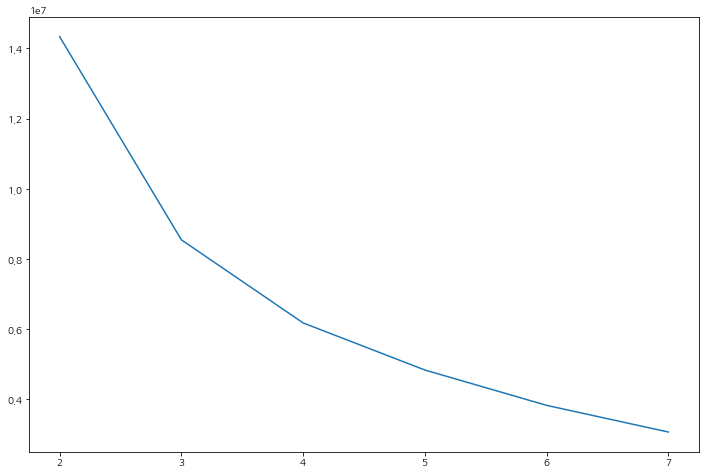

In [93]:
plt.figure(figsize=(12, 8))
sns.lineplot(x=k_range, y=inertia_ls)
plt.show()

In [94]:
kmeans = KMeans(n_clusters=5)
kmeans.fit(X)

KMeans(n_clusters=5)

In [95]:
train_X = X.copy()

In [101]:
predict = pd.DataFrame(kmeans.predict(train_X), columns=['cluster'])
df = pd.concat([train_X, predict], axis=1)
df.head()

,food_500,convenience_500,hospital_500,sports_500,tour_500,restroom_500,culture_500,cluster
0,440,31,276,29,16,13,5,0
1,667,18,202,42,3,7,3,4
2,22,1,9,6,0,2,0,1
3,97,13,68,24,0,7,0,2
4,244,22,92,46,3,15,0,2


In [102]:
# 4개의 군집으로 나눠짐
df['cluster'].unique()

array([0, 4, 1, 2, 3])

In [96]:
avg_value = silhouette_score(train_X, kmeans.labels_)
score_values = silhouette_samples(train_X, kmeans.labels_)

print('avg_value:', avg_value)
print('silhouette_samples() return 값의 shape:', score_values.shape)

avg_value: 0.5143053380623939
silhouette_samples() return 값의 shape: (847,)


c:\Users\baebi\miniconda3\envs\ds_study_2\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


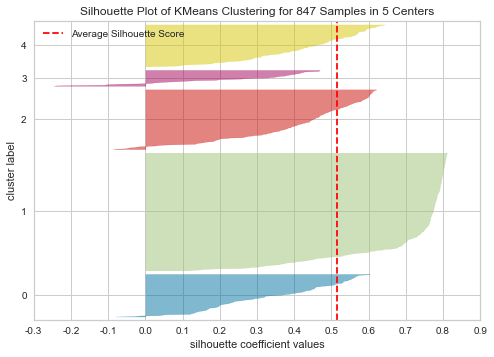

SilhouetteVisualizer(ax=<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 847 Samples in 5 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>,
                     colors='yellowbrick', estimator=KMeans(n_clusters=5))

In [100]:
# 실루엣 계수 확인 : 음수의 값이 없을 수록, 깔끔하게 나뉠수록 잘 나누어졌다고 판단.
silhouette_visualizer(kmeans, X, colors='yellowbrick')

## DecisionTreeClassifier 

- 군집화가 잘 되었다면, 군집화 결과인 라벨을 지도학습의 라벨로 사용하면 점수가 잘 나올 것이라 보고 진행.

In [105]:
X = df[['food_500', 'convenience_500', 'hospital_500', 'sports_500', 'tour_500', 'restroom_500', 'culture_500']]
y = df['cluster']

In [106]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.2,
                                                    random_state=29)

In [107]:
X_train.shape, X_test.shape

((677, 7), (170, 7))

In [108]:
DC = DecisionTreeClassifier(max_depth=5, random_state=13)
DC.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5, random_state=13)

In [109]:
pred = DC.predict(X_test)
accuracy_score(y_test, pred)

0.9411764705882353

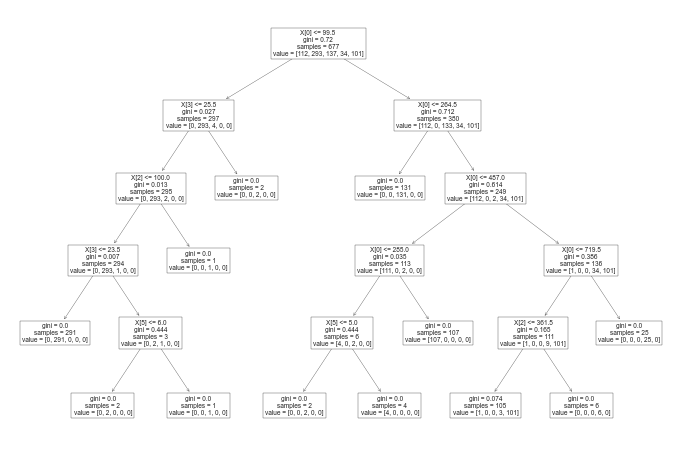

In [110]:
# plot_tree 그래프 그려보기

plt.figure(figsize=(12,8))
plot_tree(DC)
plt.show()

# 특징 EDA 및 시각화

In [103]:
# 평균
df_0 = df[df['cluster']==0]
df_1 = df[df['cluster']==1]
df_2 = df[df['cluster']==2]
df_3 = df[df['cluster']==3]
df_4 = df[df['cluster']==4]

column_means0 = df_0.mean(axis=0)
column_means1 = df_1.mean(axis=0)
column_means2 = df_2.mean(axis=0)
column_means3 = df_3.mean(axis=0)
column_means4 = df_4.mean(axis=0)

df_means = pd.DataFrame([column_means0, column_means1, column_means2, column_means3, column_means4])
df_means

,food_500,convenience_500,hospital_500,sports_500,tour_500,restroom_500,culture_500,cluster
0,386.592308,29.353846,125.838462,44.307692,9.746154,6.484615,2.107692,0.0
1,35.835196,5.374302,21.184358,7.952514,0.460894,3.326816,0.134078,1.0
2,167.505495,16.241758,67.708791,29.846154,3.104396,6.450549,0.763736,2.0
3,787.448980,39.265306,275.836735,58.183673,18.102041,9.081633,4.204082,3.0
4,596.164062,38.710938,142.000000,48.218750,19.843750,7.648438,2.000000,4.0


In [104]:
# 중앙값
df_0 = df[df['cluster']==0]
df_1 = df[df['cluster']==1]
df_2 = df[df['cluster']==2]
df_3 = df[df['cluster']==3]
df_4 = df[df['cluster']==4]

column_means0 = df_0.median(axis=0)
column_means1 = df_1.median(axis=0)
column_means2 = df_2.median(axis=0)
column_means3 = df_3.median(axis=0)
column_means4 = df_4.median(axis=0)

df_means = pd.DataFrame([column_means0, column_means1, column_means2, column_means3, column_means4])
df_means

,food_500,convenience_500,hospital_500,sports_500,tour_500,restroom_500,culture_500,cluster
0,382.0,29.5,105.5,46.0,9.5,6.0,2.0,0.0
1,33.0,4.5,16.0,6.0,0.0,3.0,0.0,1.0
2,153.0,15.0,57.0,27.0,2.0,6.0,1.0,2.0
3,809.0,34.0,244.0,59.0,20.0,8.0,4.0,3.0
4,587.5,40.0,128.5,47.5,16.0,6.5,2.0,4.0


- 밀집도에 순위를 매기자
- 밀집도 순서: 3 -> 4 -> 0 -> 2 -> 1

In [112]:
df

,food_500,convenience_500,hospital_500,sports_500,tour_500,restroom_500,culture_500,cluster
0,440,31,276,29,16,13,5,0
1,667,18,202,42,3,7,3,4
2,22,1,9,6,0,2,0,1
3,97,13,68,24,0,7,0,2
4,244,22,92,46,3,15,0,2
...,...,...,...,...,...,...,...,...
842,120,10,53,17,0,6,0,2
843,129,11,54,18,0,6,0,2
844,557,54,109,62,27,7,2,4
845,515,30,511,63,15,3,6,3


In [121]:
# 밀집도 순서 추가하는 함수
def cluTolevel(df):
    lev = []
    
    for idx, row in df.iterrows():
        if row['cluster'] == 3:
            lev.append(4)
        if row['cluster'] == 4:
            lev.append(3)
        if row['cluster'] == 0:
            lev.append(2)
        if row['cluster'] == 2:
            lev.append(1)
        if row['cluster'] == 1:
            lev.append(0)
    return lev

level = cluTolevel(df)

In [122]:
def color_select(row):
    level = row.level
    
    if level == 4:
        return '#e87272' #빨 가장 밀도가 높음
    elif level == 3:
        return '#e8a372' #주
    elif level == 2:
        return '#e8dc72' #노
    elif level == 1:
        return '#37874a' #초
    elif level == 0:
        return '#6c99d9' #파 가장 밀도가 적음

In [123]:
random_population_density_500

,address,lat,lng,food_500,convenience_500,hospital_500,sports_500,tour_500,restroom_500,culture_500,...,s_dong,population,population_day,pop_of_convenience,pop_of_restroom,pop_of_sports,pop_of_tour,pop_of_food,pop_of_culture,pop_of_hospital
0,대한민국 서울특별시 논현동 22번지 논현아파트 상가 112호 늑대와여우컴퓨터 강남구...,37.514758,127.023193,440,31,276,29,16,13,5,...,논현동,644.65914,21.48864,1.442623,0.604971,1.349550,0.744579,20.475935,0.232681,12.843996
1,대한민국 서울특별시 강남구 청담동 79-18,37.526978,127.042847,667,18,202,42,3,7,3,...,청담동,308.09127,10.26971,1.752727,0.681616,4.089697,0.292121,64.948280,0.292121,19.669494
2,대한민국 서울특별시 강남구 세곡동 159-2,37.462859,127.108274,22,1,9,6,0,2,0,...,세곡동,326.24060,10.87469,0.091957,0.183913,0.551740,0.000000,2.023046,0.000000,0.827610
3,대한민국 서울특별시 대청역,37.492787,127.078801,97,13,68,24,0,7,0,...,일원동,400.22973,13.34099,0.974440,0.524699,1.798967,0.000000,7.270825,0.000000,5.097073
4,대한민국 서울특별시 강남구 도곡동 934-10,37.488674,127.036914,244,22,92,46,3,15,0,...,도곡동,474.15568,15.80519,1.391948,0.949055,2.910436,0.189811,15.437967,0.000000,5.820873
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
842,대한민국 서울특별시 강남구 수서동 713-3,37.489028,127.103476,120,10,53,17,0,6,0,...,수서동,164.57392,5.48580,1.822888,1.093733,3.098910,0.000000,21.874658,0.000000,9.661307
843,대한민국 서울특별시 강남구 광평로51길 22,37.489247,127.101722,129,11,54,18,0,6,0,...,수서동,164.57392,5.48580,2.005177,1.093733,3.281199,0.000000,23.515258,0.000000,9.843596
844,대한민국 서울특별시 강남구 논현로 418,37.497571,127.038916,557,54,109,62,27,7,2,...,역삼동,1170.12100,39.00403,1.384472,0.179469,1.589579,0.692236,14.280576,0.051277,2.794583
845,대한민국 서울특별시 강남구 압구정로30길 45,37.524446,127.028869,515,30,511,63,15,3,6,...,신사동,264.60904,8.82030,3.401245,0.340124,7.142614,1.700622,58.388037,0.680249,57.934537


In [124]:
df['level'] = level
df['lat'] = random_population_density_500['lat']
df['lng'] = random_population_density_500['lng']

In [125]:
m = folium.Map(location=[37.4966, 127.0628], zoom_start=13)
m.choropleth(geo_data=geo_str, fill_color='#bdbbbb')

for idx, row in df.iterrows():
    folium.Circle(
        location=[row['lat'], row['lng']],
        radius=50,
        color=color_select(row),
        fill_color=color_select(row)
    ).add_to(m)
    
m

c:\Users\baebi\miniconda3\envs\ds_study_2\lib\site-packages\folium\folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


- 음식점 위치 시각화

In [63]:
m = folium.Map(location=[37.4966, 127.0628], zoom_start=13)
m.choropleth(geo_data=geo_str, fill_color='#bdbbbb')

for idx, row in food[['lat', 'lng']].iterrows():
    folium.Circle(
        location=[row['lat'], row['lng']],
        radius=10,
        color='orange'
    ).add_to(m)
    
m

c:\Users\baebi\miniconda3\envs\ds_study_2\lib\site-packages\folium\folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(
